# 🚧 Fog-Resilient Mine Safety — YOLOv8 Object Detection

### Human • Vehicle • Obstacle

**Objective:** Train and evaluate a YOLOv8 object-detection model for CCTV-style scenes under adverse visibility, then use the trained model to automatically annotate additional real-world footage frames.

This notebook covers:

1. Environment setup
2. Dataset structure and class verification
3. Dataset sanity checks and visualisation
4. Pretrained YOLOv8 baseline
5. Training
6. Quantitative validation and held-out test evaluation
7. Training curves and diagnostic plots
8. Validation/test predictions
9. Confidence-threshold analysis
10. Inference speed
11. Model export
12. Automatic labeling of real-world images from `actual images`

> **Dataset:** `ThroughTheFog_full/`, containing the generated `train`, `val`, and `test` splits.
>
> **Classes:** `0 = Human`, `1 = Vehicle`, `2 = Obstacle`.
>
> The `actual images` folder is **inference-only**. Its images are not used for training or evaluation unless you explicitly create reviewed labels and add them to a future training split.


## 1. Problem Definition

The ML component of the proposed mine-safety system has two independent outputs:

```text
                 CCTV FRAME
                      │
             ┌────────┴────────┐
             ▼                 ▼
          YOLOv8            Fog model
             │                 │
             ▼                 ▼
   human / vehicle /       clear /
       obstacle          moderate / dense
```

This notebook handles **only the object detector**. 

### Detection classes

| ID | Class |
|---:|---|
| 0 | human |
| 1 | vehicle |
| 2 | obstacle |

The final detector should report a bounding box, class, and confidence for each detected object.


## Dataset Used for Training

The dataset is the newly generated **ThroughTheFog_full** YOLO dataset.

Expected structure:

```text
ThroughTheFog_full/
├── data.yaml
├── images/
│   ├── train/
│   ├── val/
│   └── test/
└── labels/
    ├── train/
    ├── val/
    └── test/
```

### Detection classes

| YOLO ID | Class |
|---:|---|
| 0 | Human |
| 1 | Vehicle |
| 2 | Obstacle |

The dataset split is created before this notebook is run. The held-out `test` set must remain untouched during training and model selection.


In [2]:
# Run this once if the packages are not installed.
%pip install ultralytics pillow opencv-python pandas matplotlib numpy


Note: you may need to restart the kernel to use updated packages.


## 2. Why YOLOv8?

**YOLO (You Only Look Once)** performs object detection in a single neural-network pipeline, making it suitable for real-time perception.

For the prototype we use **YOLOv8n**, the nano variant, because it provides a lightweight baseline that is practical to train on a Jupyter GPU and later deploy on constrained hardware.

We start from **COCO-pretrained weights** and fine-tune them on the mine/adverse-visibility dataset.

**Experimental principle:** establish a working baseline first; larger YOLOv8 variants can be compared later if compute/time permits.


## 3. Install and Import Libraries

In [3]:
# Install Ultralytics YOLOv8
!pip -q install ultralytics

# Optional: upgrade if your Jupyter environment has an older version
# !pip -q install -U ultralytics


In [4]:
import os
import random
import shutil
import time
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import display

from ultralytics import YOLO

import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


PyTorch version: 2.13.0+cpu
CUDA available: False


## 4. Configure local folder and Dataset Path

Keep the trained model and important outputs in local folder so they survive Jupyter sessions.

### Expected YOLO dataset structure

```text
dataset/
├── data.yaml
├── images/
│   ├── train/
│   ├── val/
│   └── test/
└── labels/
    ├── train/
    ├── val/
    └── test/
```

Each label file contains:

```text
class_id  x_center  y_center  width  height
```

with coordinates normalized to `[0, 1]`.


In [5]:
# Local Jupyter execution: no Drive mounting required.
print("Running from the local dataset folder.")


Running from the local dataset folder.


In [48]:
# =========================
# LOCAL DATASET PATH
# =========================

from pathlib import Path

PROJECT_DIR = Path.cwd()

# Newly generated dataset from the split script
DATASET_DIR = PROJECT_DIR / "ThroughTheFog_full"
DATA_YAML = DATASET_DIR / "data.yaml"

# Folder containing real-world / YouTube footage frames.
# Keep this folder next to the notebook:
# PROJECT_DIR/
# ├── ThroughTheFog_full/
# ├── actual images/
# └── this_notebook.ipynb
ACTUAL_IMAGES_DIR = PROJECT_DIR / "actual images"

# Where automatically labeled real-world images will be saved
ACTUAL_OUTPUT_DIR = PROJECT_DIR / "actual_images_labeled"
ACTUAL_OUTPUT_IMAGES_b = ACTUAL_OUTPUT_DIR / "images_baseline"
ACTUAL_OUTPUT_LABELS_b = ACTUAL_OUTPUT_DIR / "labels_baseline"
ACTUAL_OUTPUT_IMAGES = ACTUAL_OUTPUT_DIR / "images"
ACTUAL_OUTPUT_LABELS = ACTUAL_OUTPUT_DIR / "labels"

print("Working directory :", PROJECT_DIR.resolve())
print("Dataset directory :", DATASET_DIR.resolve())
print("data.yaml         :", DATA_YAML.resolve())
print("Actual images     :", ACTUAL_IMAGES_DIR.resolve())
print("Dataset exists    :", DATASET_DIR.exists())
print("Actual images dir :", ACTUAL_IMAGES_DIR.exists())


Working directory : C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads
Dataset directory : C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full
data.yaml         : C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\data.yaml
Actual images     : C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\actual images
Dataset exists    : True
Actual images dir : True


## 5. Verify the Dataset Before Training


The dataset must contain matching image/label files. Empty-label images are allowed for background-only images, but every annotated image should have a corresponding `.txt` label file.


In [7]:
# Inspect the expected YOLO directory structure

required_dirs = [
    DATASET_DIR / "images" / "train",
    DATASET_DIR / "images" / "val",
    DATASET_DIR / "images" / "test",
    DATASET_DIR / "labels" / "train",
    DATASET_DIR / "labels" / "val",
    DATASET_DIR / "labels" / "test",
]

for d in required_dirs:
    print(f"{'✓' if d.exists() else '✗'} {d}")

if not all(d.exists() for d in required_dirs):
    raise FileNotFoundError(
        "One or more required train/val/test directories are missing. "
        "Run the dataset split script first."
    )


✓ c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\images\train
✓ c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\images\val
✓ c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\images\test
✓ c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\train
✓ c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\val
✓ c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\test


In [8]:
# Count images and labels in each split

IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def count_files(folder, extensions=None):
    if not folder.exists():
        return 0
    files = list(folder.rglob("*"))
    if extensions:
        return sum(
            f.is_file() and f.suffix.lower() in extensions
            for f in files
        )
    return sum(f.is_file() for f in files)

split_counts = {}

for split in ["train", "val", "test"]:
    n_images = count_files(DATASET_DIR / "images" / split, IMAGE_EXTS)
    n_labels = count_files(DATASET_DIR / "labels" / split, {".txt"})

    split_counts[split] = {
        "images": n_images,
        "labels": n_labels
    }

    print(
        f"{split:5s} | images: {n_images:6d} | "
        f"labels: {n_labels:6d}"
    )


train | images:   8906 | labels:   8906
val   | images:   2544 | labels:   2544
test  | images:   1273 | labels:   1273


In [ ]:
# Create/verify data.yaml for the new train/val/test dataset

CLASS_NAMES = ["human", "vehicle", "obstacle"]

yaml_text = f'''path: "{DATASET_DIR.as_posix()}"
train: images/train
val: images/val
test: images/test

names:
  0: human
  1: vehicle
  2: obstacle
'''

DATA_YAML.write_text(yaml_text, encoding="utf-8")

print(DATA_YAML.read_text(encoding="utf-8"))


### `data.yaml`

The notebook creates the dataset configuration automatically:

```yaml
train: images/train
val: images/val
test: images/test

names:
  0: human
  1: vehicle
  2: obstacle
```

The class order **must match the IDs used in the YOLO label files**.


## 6. Visualise Training Images and Ground-Truth Boxes

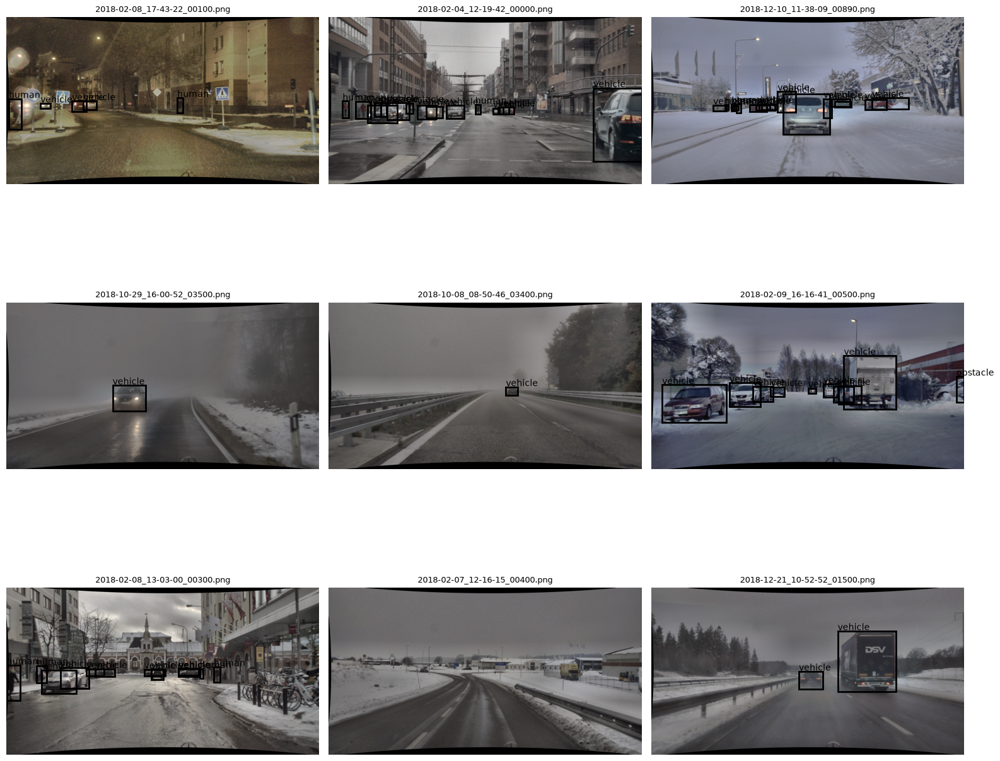

In [9]:
# Draw YOLO-format ground-truth boxes on random images

CLASS_NAMES = ["human", "vehicle", "obstacle"]

def load_yolo_labels(label_path):
    labels = []
    if not label_path.exists():
        return labels

    for line in label_path.read_text().splitlines():
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        cls, xc, yc, w, h = map(float, parts)
        labels.append((int(cls), xc, yc, w, h))
    return labels


def show_ground_truth_samples(split="train", n=9, seed=42):
    image_dir = DATASET_DIR / "images" / split
    label_dir = DATASET_DIR / "labels" / split

    images = [p for p in image_dir.rglob("*") if p.suffix.lower() in IMAGE_EXTS]
    if not images:
        print("No images found.")
        return

    random.seed(seed)
    selected = random.sample(images, min(n, len(images)))

    cols = 3
    rows = int(np.ceil(len(selected) / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(16, 5 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, image_path in zip(axes, selected):
        img = cv2.imread(str(image_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        h, w = img.shape[:2]
        label_path = label_dir / f"{image_path.stem}.txt"

        for cls, xc, yc, bw, bh in load_yolo_labels(label_path):
            x1 = int((xc - bw / 2) * w)
            y1 = int((yc - bh / 2) * h)
            x2 = int((xc + bw / 2) * w)
            y2 = int((yc + bh / 2) * h)

            ax.add_patch(
                plt.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    fill=False, linewidth=2
                )
            )
            ax.text(
                x1, max(0, y1 - 5),
                CLASS_NAMES[cls] if cls < len(CLASS_NAMES) else f"class_{cls}",
                fontsize=10
            )

        ax.imshow(img)
        ax.set_title(image_path.name, fontsize=9)
        ax.axis("off")

    for ax in axes[len(selected):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_ground_truth_samples("train", n=9)


## 7. Dataset Statistics

Before training, record the number of objects per class. This is important because class imbalance can affect precision, recall and mAP.

We will also check for invalid class IDs and malformed label rows.


In [10]:
from collections import Counter

def dataset_statistics(split):
    label_dir = DATASET_DIR / "labels" / split
    counter = Counter()
    malformed = []
    invalid_ids = []

    for label_path in label_dir.rglob("*.txt"):
        for line_no, line in enumerate(label_path.read_text().splitlines(), start=1):
            parts = line.strip().split()
            if not parts:
                continue
            if len(parts) != 5:
                malformed.append((str(label_path), line_no, line))
                continue
            try:
                cls, xc, yc, w, h = map(float, parts)
            except ValueError:
                malformed.append((str(label_path), line_no, line))
                continue
            if int(cls) not in range(len(CLASS_NAMES)):
                invalid_ids.append((str(label_path), line_no, int(cls)))
                continue
            counter[int(cls)] += 1
    return counter, malformed, invalid_ids

stats = {}
for split in ["train", "val"]:
    counter, malformed, invalid = dataset_statistics(split)
    stats[split] = counter
    print(f"\n{split.upper()}")
    for cls_id, name in enumerate(CLASS_NAMES):
        print(f"  {name:10s}: {counter.get(cls_id, 0)} objects")
    print("  malformed:", len(malformed))
    print("  invalid class IDs:", len(invalid))



TRAIN
  human     : 28442 objects
  vehicle   : 43032 objects
  obstacle  : 1651 objects
  malformed: 0
  invalid class IDs: 0

VAL
  human     : 7963 objects
  vehicle   : 11812 objects
  obstacle  : 424 objects
  malformed: 0
  invalid class IDs: 0


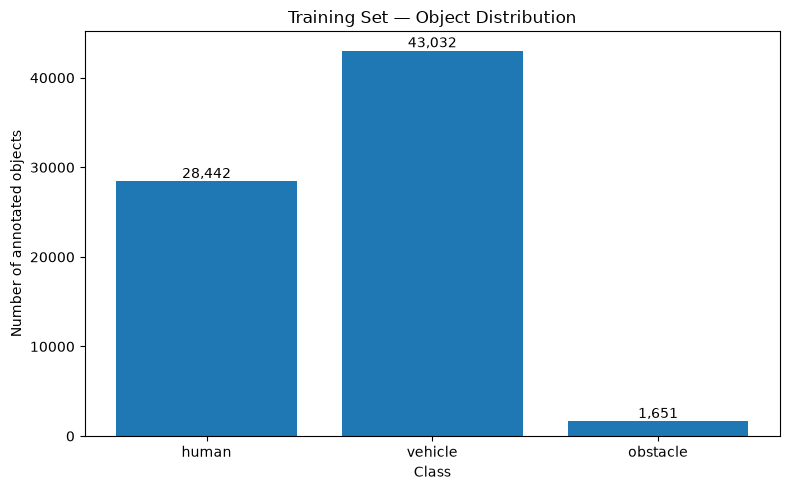

In [11]:
# Plot class distribution for the training set

train_counts = [stats["train"].get(i, 0) for i in range(len(CLASS_NAMES))]

plt.figure(figsize=(8, 5))
bars = plt.bar(CLASS_NAMES, train_counts)
plt.title("Training Set — Object Distribution")
plt.xlabel("Class")
plt.ylabel("Number of annotated objects")

for bar, value in zip(bars, train_counts):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height(),
        f"{value:,}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()
plt.show()


## 8. Baseline: Pretrained YOLOv8n

Before fine-tuning, we can run the COCO-pretrained YOLOv8n model on sample images.

This establishes a qualitative baseline and demonstrates the difference between **generic pretrained detection** and **project-specific fine-tuning**.


In [12]:
# Load pretrained YOLOv8 nano
baseline_model = YOLO("yolov8n.pt")

print("Loaded pretrained YOLOv8n.")


Loaded pretrained YOLOv8n.


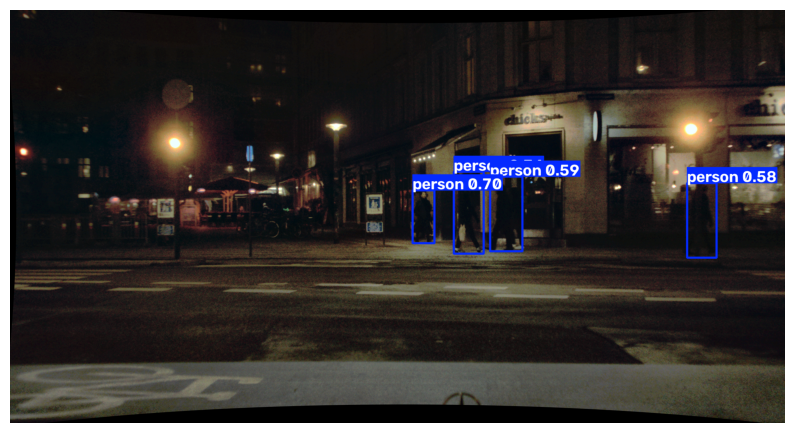

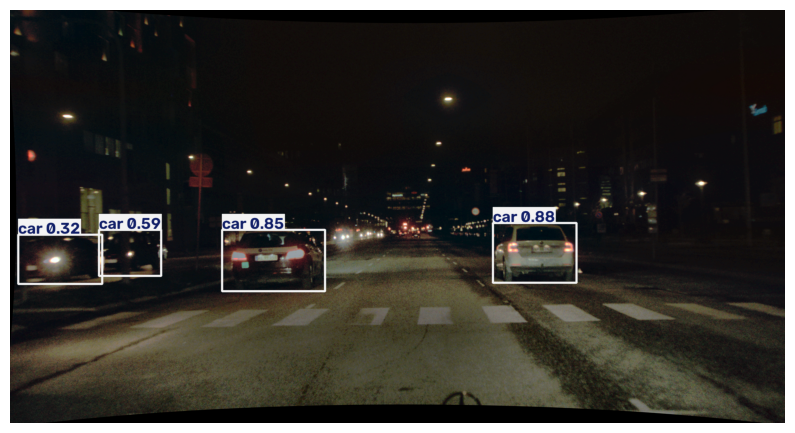

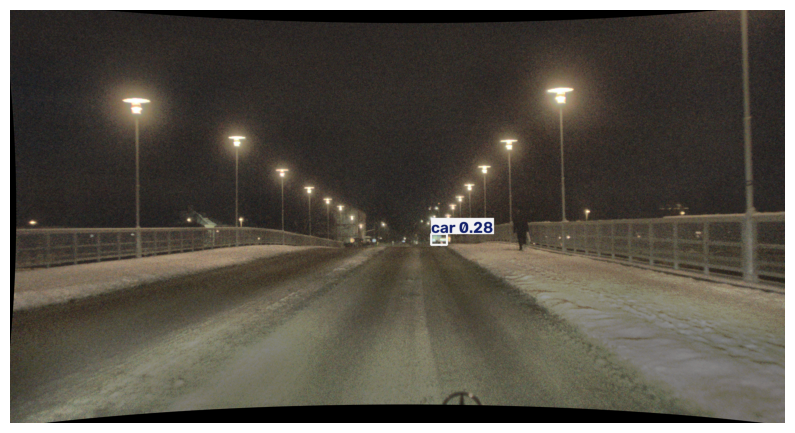

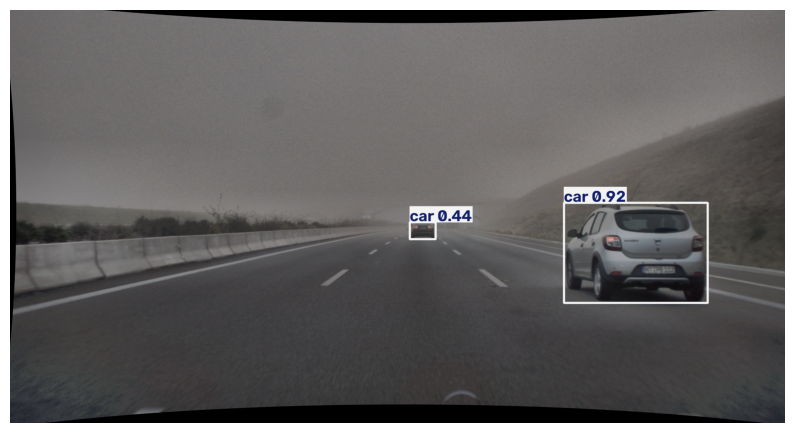

In [13]:
# Run pretrained inference on a few project images

train_images = [
    p for p in (DATASET_DIR / "images" / "train").rglob("*")
    if p.suffix.lower() in IMAGE_EXTS
]

if train_images:
    sample_paths = random.sample(train_images, min(4, len(train_images)))

    results = baseline_model.predict(
        source=[str(p) for p in sample_paths],
        imgsz=640,
        conf=0.25,
        verbose=False
    )

    for result in results:
        annotated = result.plot()
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 7))
        plt.imshow(annotated)
        plt.axis("off")
        plt.show()
else:
    print("No training images found.")


## 9. Train YOLOv8n on the Full ThroughTheFog Dataset

### Main hyperparameters

- **Model:** YOLOv8n
- **Image size:** 640 × 640
- **Epochs:** configurable below
- **Pretrained weights:** `yolov8n.pt`
- **Task:** object detection
- **Classes:** human, vehicle, obstacle
- **Device:** automatically uses CUDA GPU when available; otherwise CPU

The best checkpoint is selected using validation performance. The test set is used only for final held-out evaluation.


In [37]:
IMAGE_SIZE = 640

TRAIN_EPOCHS = 20
IMAGE_SIZE = 640

DEVICE = 0 if torch.cuda.is_available() else "cpu"


In [ ]:
# Train the project-specific detector

model = YOLO("yolov8n.pt")

TRAIN_EPOCHS = 20
IMAGE_SIZE = 640

DEVICE = 0 if torch.cuda.is_available() else "cpu"

train_results = model.train(
    data=str(DATA_YAML),
    epochs=TRAIN_EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=-1,
    device=DEVICE,
    workers=2,
    project=str(PROJECT_DIR / "runs"),
    name="yolov8n_fog_mine_full",
    pretrained=True,
    patience=10,
    plots=True,
    verbose=True
)

print("Training complete.")
print("Device used:", DEVICE)


In [1]:
from ultralytics import YOLO

model = YOLO(
    r"C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full\weights\last.pt"
)


model.train(resume=True)

New https://pypi.org/project/ultralytics/8.4.146 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002C3CCA7B570>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          

The trained YOLOv8n model achieved a Precision of 57.9%, Recall of 44.9%, mAP@0.50 of 49.4%, and mAP@0.50:0.95 of 31.1% on the validation dataset.

## 10. Locate the Best Model and Training Outputs

The most important file is:

```text
weights/best.pt
```

This is the checkpoint with the best validation fitness according to the training run.

Other useful outputs include:

- `results.csv`
- `results.png`
- `confusion_matrix.png`
- `confusion_matrix_normalized.png`
- `P_curve.png`
- `R_curve.png`
- `PR_curve.png`
- `F1_curve.png`


In [14]:
RUN_DIR = PROJECT_DIR / "runs" / "yolov8n_fog_mine_full"
BEST_MODEL = RUN_DIR / "weights" / "best.pt"
RESULTS_CSV = RUN_DIR / "results.csv"

print("Run directory:", RUN_DIR)
print("Best model exists:", BEST_MODEL.exists())
print("Results CSV exists:", RESULTS_CSV.exists())

if not BEST_MODEL.exists():
    raise FileNotFoundError(
        "best.pt was not found. Complete training before evaluation/inference."
    )


Run directory: c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full
Best model exists: True
Results CSV exists: True


## 11. Training Curves and Diagnostic Plots


results.png


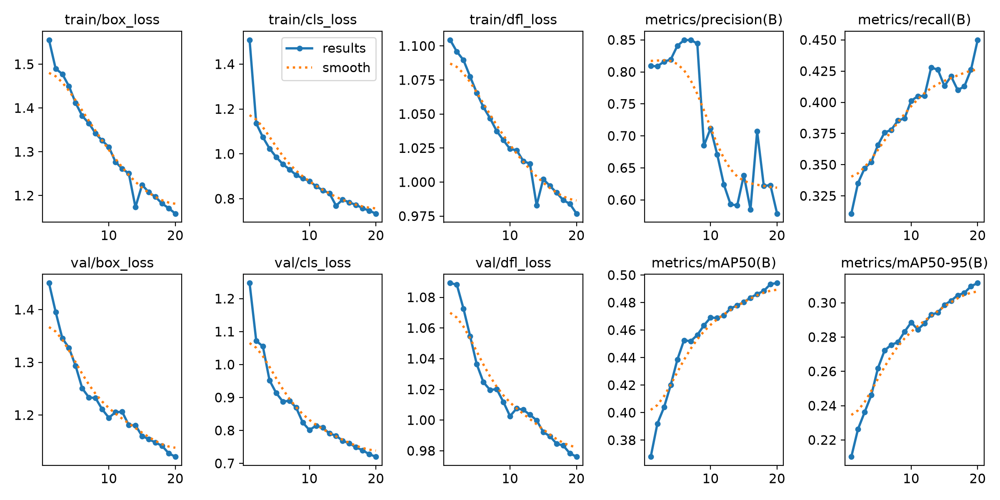


confusion_matrix.png


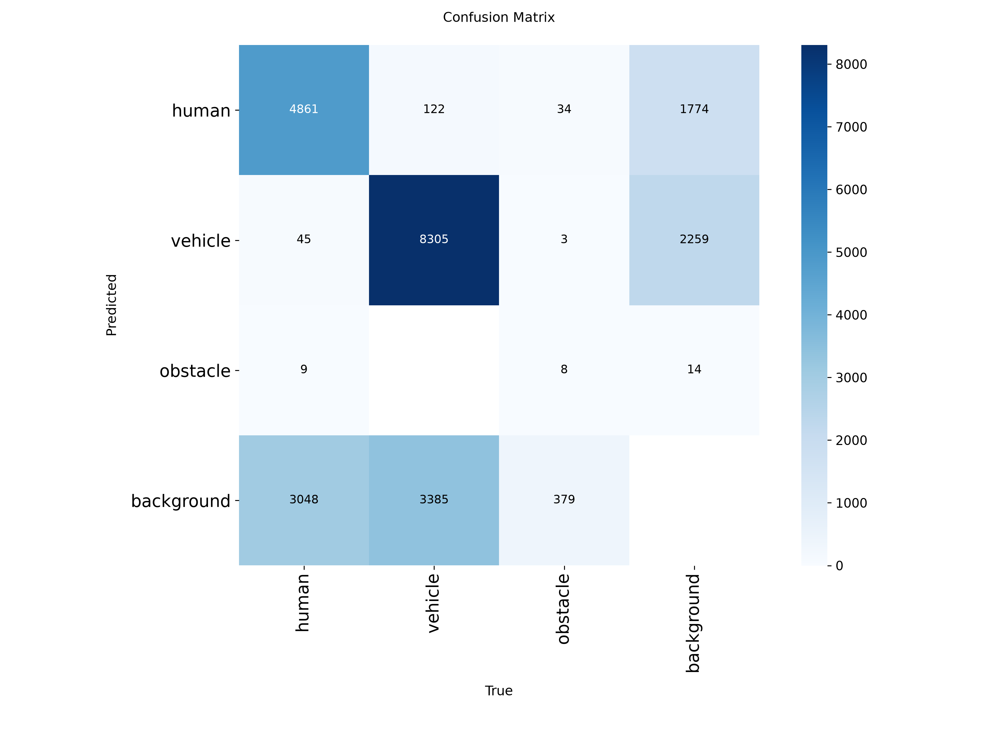


confusion_matrix_normalized.png


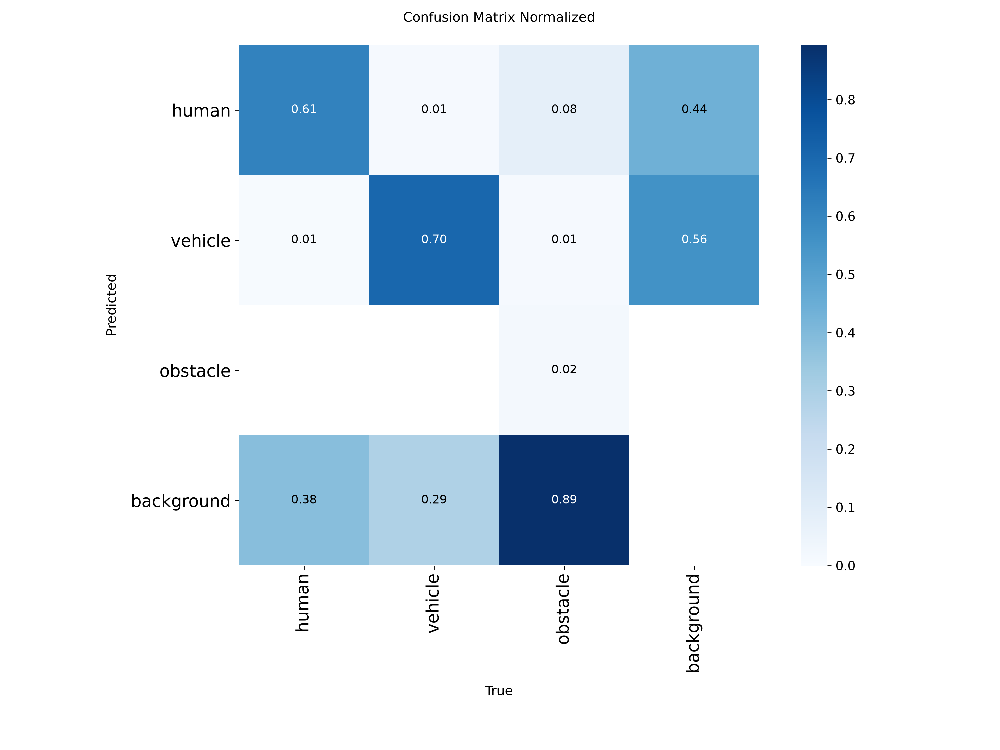

Not found: c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full\P_curve.png
Not found: c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full\R_curve.png
Not found: c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full\PR_curve.png
Not found: c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full\F1_curve.png


In [15]:
# Display Ultralytics-generated diagnostic plots

plot_names = [
    "results.png",
    "confusion_matrix.png",
    "confusion_matrix_normalized.png",
    "P_curve.png",
    "R_curve.png",
    "PR_curve.png",
    "F1_curve.png",
]

for name in plot_names:
    path = RUN_DIR / name
    if path.exists():
        print(f"\n{name}")
        display(Image.open(path))
    else:
        print(f"Not found: {path}")


In [17]:
# Read and inspect results.csv

if RESULTS_CSV.exists():
    history = pd.read_csv(RESULTS_CSV)
    history.columns = history.columns.str.strip()
    display(history.head(20))
else:
    history = None
    print("results.csv not found.")


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,4697.32,1.55552,1.50784,1.10444,0.80922,0.31078,0.36798,0.21021,1.45040,1.24733,1.08928,0.000475,0.000475,0.000475
1,2,3559.26,1.48989,1.13587,1.09585,0.80875,0.33518,0.39207,0.22628,1.39563,1.07203,1.08825,0.000905,0.000905,0.000905
2,3,7664.91,1.47771,1.07426,1.08966,0.81607,0.34713,0.40391,0.23621,1.34584,1.05502,1.07263,0.001287,0.001287,0.001287
3,4,12461.20,1.44988,1.02370,1.07750,0.81924,0.35221,0.42001,0.24612,1.32745,0.95195,1.05471,0.001217,0.001217,0.001217
4,5,16838.70,1.41175,0.98588,1.06552,0.84071,0.36567,0.43852,0.26185,1.29346,0.91369,1.03636,0.001146,0.001146,0.001146
5,6,21040.10,1.38181,0.95401,1.05506,0.84957,0.37578,0.45262,0.27217,1.25063,0.88763,1.02469,0.001075,0.001075,0.001075
6,7,24877.00,1.36507,0.93072,1.04685,0.84994,0.37792,0.45195,0.27550,1.23352,0.89019,1.01964,0.001005,0.001005,0.001005
7,8,28678.10,1.34196,0.90549,1.03748,0.84430,0.38532,0.45641,0.27698,1.23235,0.86939,1.02019,0.000934,0.000934,0.000934
8,9,32285.80,1.32551,0.89024,1.03077,0.68492,0.38716,0.46344,0.28313,1.21086,0.82380,1.01183,0.000863,0.000863,0.000863
9,10,35858.20,1.31090,0.87854,1.02434,0.71176,0.40119,0.46915,0.28854,1.19496,0.80134,1.00259,0.000792,0.000792,0.000792


### Current experiment

This notebook evaluates the YOLOv8n detector trained on the complete `ThroughTheFog_full` train/validation/test split. Do not copy metrics from an earlier 3K prototype run; the values shown in the evaluation cells are the results for the current experiment.


The validation and held-out test metrics should be interpreted together with the per-class results, confusion matrix, and qualitative predictions. In particular, inspect the **Obstacle** class separately because its performance may differ substantially from Human and Vehicle.


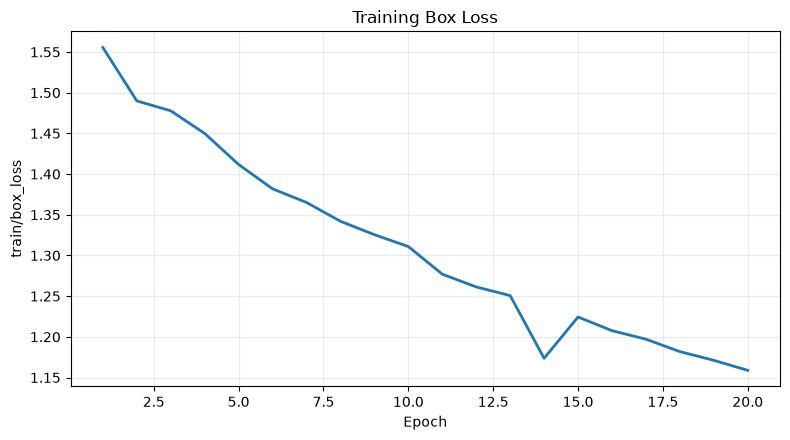

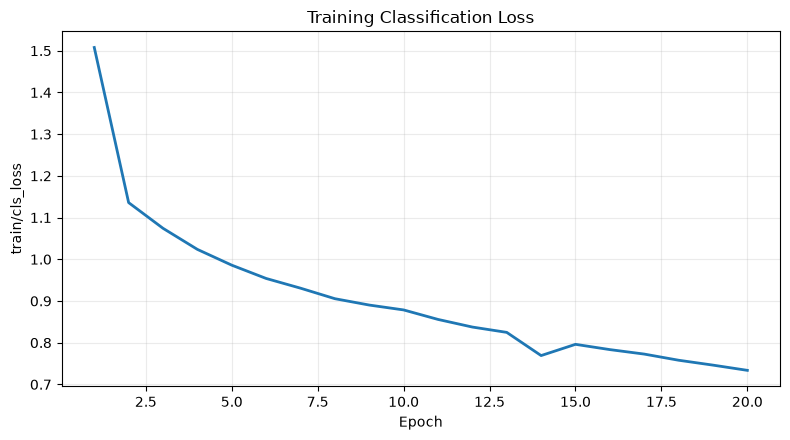

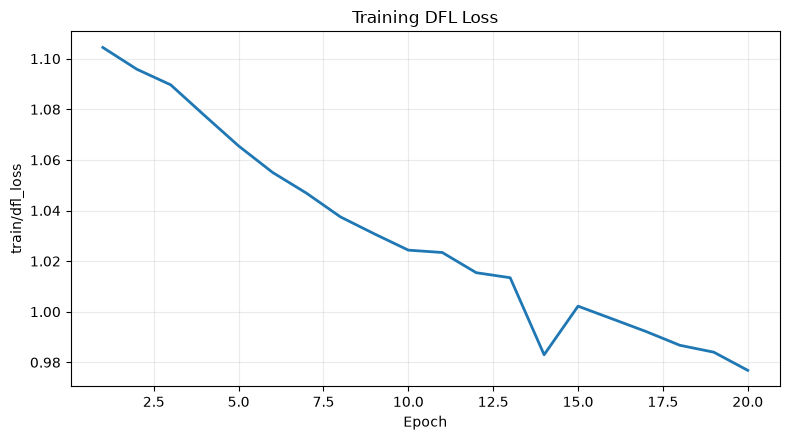

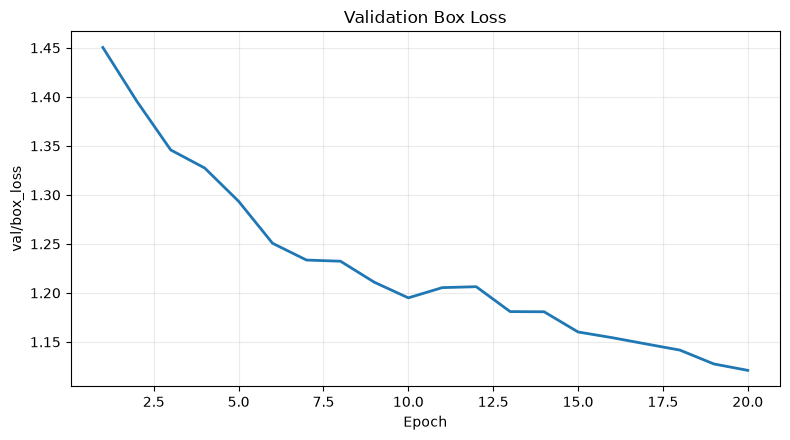

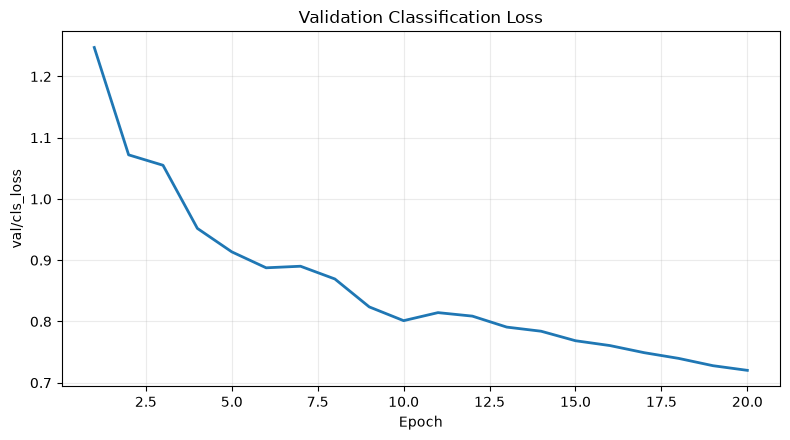

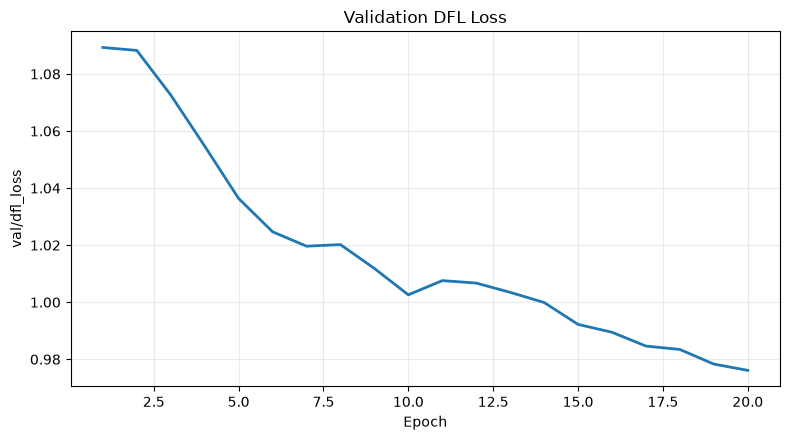

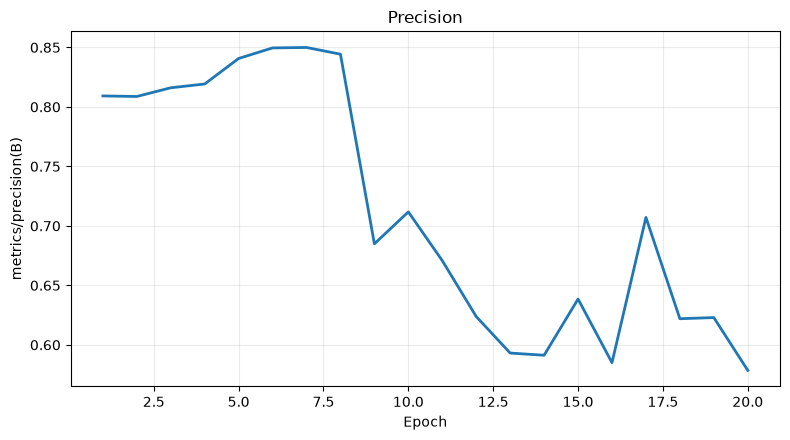

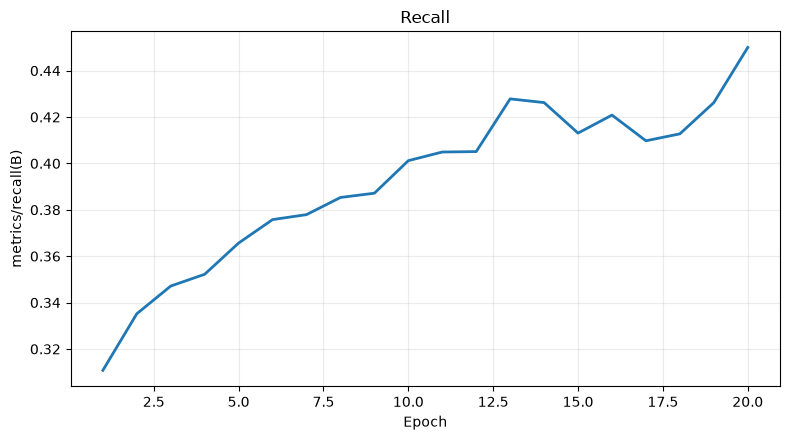

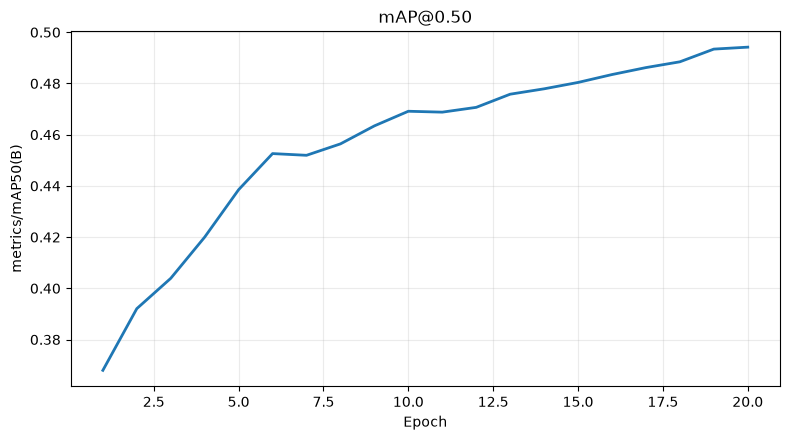

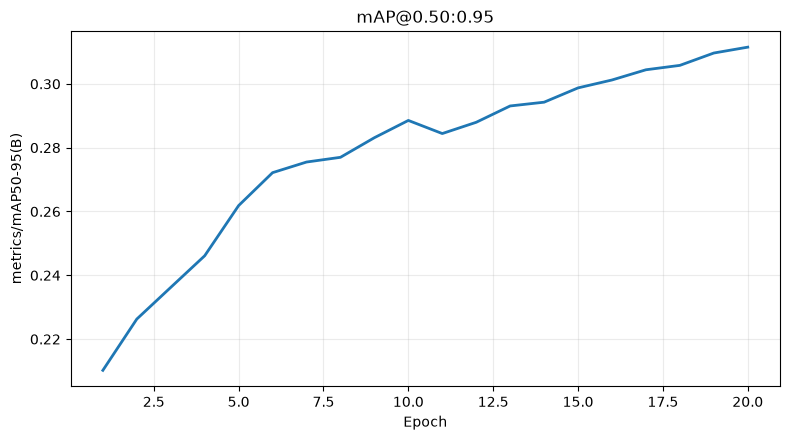

In [18]:
# Plot key training/validation metrics individually for a clean report

if history is not None:
    plot_specs = [
        ("train/box_loss", "Training Box Loss"),
        ("train/cls_loss", "Training Classification Loss"),
        ("train/dfl_loss", "Training DFL Loss"),
        ("val/box_loss", "Validation Box Loss"),
        ("val/cls_loss", "Validation Classification Loss"),
        ("val/dfl_loss", "Validation DFL Loss"),
        ("metrics/precision(B)", "Precision"),
        ("metrics/recall(B)", "Recall"),
        ("metrics/mAP50(B)", "mAP@0.50"),
        ("metrics/mAP50-95(B)", "mAP@0.50:0.95"),
    ]

    for column, title in plot_specs:
        if column in history.columns:
            plt.figure(figsize=(8, 4.5))
            plt.plot(history["epoch"], history[column], linewidth=2)
            plt.title(title)
            plt.xlabel("Epoch")
            plt.ylabel(column)
            plt.grid(alpha=0.25)
            plt.tight_layout()
            plt.show()


## 12. Quantitative Evaluation on the Validation Set

### Metrics reported

**Precision**

> Of all predicted positive detections, how many were correct?

**Recall**

> Of all ground-truth objects, how many were detected?

**mAP@0.50**

Mean Average Precision using an IoU threshold of 0.50.

**mAP@0.50:0.95**

Mean Average Precision averaged over IoU thresholds from 0.50 to 0.95. This is a stricter metric and is useful for comparing localization quality.

For the prototype report, record **precision, recall, mAP50 and mAP50-95** on the validation set, and also inspect the per-class results.


In [21]:
# Load the best checkpoint

best_model = YOLO(str(BEST_MODEL))

# Evaluate on the VALIDATION split
val_metrics = best_model.val(
    data=str(DATA_YAML),
    split="val",
    imgsz=IMAGE_SIZE,
    device="cpu",
    plots=True,
    project=str(PROJECT_DIR / "runs"),
    name="validation_evaluation"
)

print("\n===== VALIDATION SET RESULTS =====")

metrics_dict = val_metrics.results_dict

for key in [
    "metrics/precision(B)",
    "metrics/recall(B)",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)",
]:
    if key in metrics_dict:
        print(f"{key:30s}: {metrics_dict[key]:.4f}")


Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
Model summary (fused): 73 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 886.518.4 MB/s, size: 2862.7 KB)
val: Scanning C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\val.cache... 2544 images, 21 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2544/2544 205.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 159/159 1.8s/it 4:422.1ss
                   all       2544      20199      0.579      0.449      0.494      0.311
                 human       1580       7963      0.688      0.614      0.659      0.375
               vehicle       2385      11812       0.76      0.707      0.774      0.543
              obstacle        262        424      0.289      0.025     0.0487     0.0169
Speed: 1.2ms preprocess, 56.7ms inference, 0.0ms loss, 1.1ms

In [24]:
# Per-class metrics on the validation set, when available

print("\n===== PER-CLASS VALIDATION RESULTS =====")

try:
    box = val_metrics.box
    print("mAP50 per class:", box.ap50)
    print("mAP50-95 per class:", box.ap)
    if hasattr(box, "p"):
        print("Precision per class:", box.p)
    if hasattr(box, "r"):
        print("Recall per class:", box.r)
except Exception as e:
    print("Per-class arrays could not be read:", e)



===== PER-CLASS VALIDATION RESULTS =====
mAP50 per class: [    0.65949     0.77423    0.048734]
mAP50-95 per class: [    0.37479     0.54267    0.016854]
Precision per class: [    0.68752     0.75953     0.28932]
Recall per class: [    0.61396     0.70725     0.02498]


In [25]:
# Check if a much lower confidence threshold recovers any obstacle recall
for conf in [0.05, 0.10, 0.15]:
    m = best_model.val(data=str(DATA_YAML), split="val", imgsz=IMAGE_SIZE,
                        conf=conf, device="cpu", plots=False, verbose=False)
    r = m.box.r[2]  # index 2 = "obstacle"
    print(f"conf={conf}: obstacle recall = {r:.3f}")

Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
val: Fast image access  (ping: 0.30.1 ms, read: 698.0190.5 MB/s, size: 3023.2 KB)
val: Scanning C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\val.cache... 2544 images, 21 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2544/2544 444.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 159/159 2.5s/it 6:312.6ss
                   all       2544      20199      0.579      0.449      0.478      0.305
Speed: 1.2ms preprocess, 70.9ms inference, 0.0ms loss, 1.2ms postprocess per image
conf=0.05: obstacle recall = 0.025
Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
val: Fast image access  (ping: 0.20.0 ms, read: 865.3158.8 MB/s, size: 2916.6 KB)
val: Scanning C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\val.cache... 2

## 13. Held-Out Test Set Evaluation

The test set was separated before training and is used here only for final unbiased evaluation.


In [23]:

from pathlib import Path

# Load best model selected during training
    

BEST_MODEL_PATH = Path(
    RUN_DIR  / "weights" / "best.pt"
)

model = YOLO(str(BEST_MODEL_PATH))
# Evaluate on TEST split
test_results = model.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=640,
    device="cpu"
)

print("\n" + "=" * 60)
print("FINAL HELD-OUT TEST RESULTS")
print("=" * 60)

print(f"Precision   : {test_results.box.mp:.4f}")
print(f"Recall      : {test_results.box.mr:.4f}")
print(f"mAP@50      : {test_results.box.map50:.4f}")
print(f"mAP@50-95   : {test_results.box.map:.4f}")

Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
Model summary (fused): 73 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.50.1 ms, read: 843.4102.9 MB/s, size: 2778.5 KB)
val: Scanning C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\test.cache... 1272 images, 8 backgrounds, 1 corrupt: 100% ━━━━━━━━━━━━ 1273/1273 314.1Mit/s 0.0s
val: C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\images\test\2018-02-12_07-00-16_00200.png: ignoring corrupt image/label: broken PNG file (bad header checksum in b'IDAT')
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 80/80 2.4s/it 3:132.4ss
                   all       1272      10278      0.629      0.425      0.494      0.314
                 human        806       4009      0.748      0.582      0.657      0.379
               vehicle       1182      

## 13. Confusion Matrix

The confusion matrix helps identify which object categories are being confused.

For this project, pay particular attention to:

- **human ↔ obstacle**
- **vehicle ↔ obstacle**
- missed detections (false negatives)
- false positives in visually degraded/foggy regions

A high overall mAP can still hide poor performance on a safety-critical class, so the per-class results matter.


confusion_matrix.png


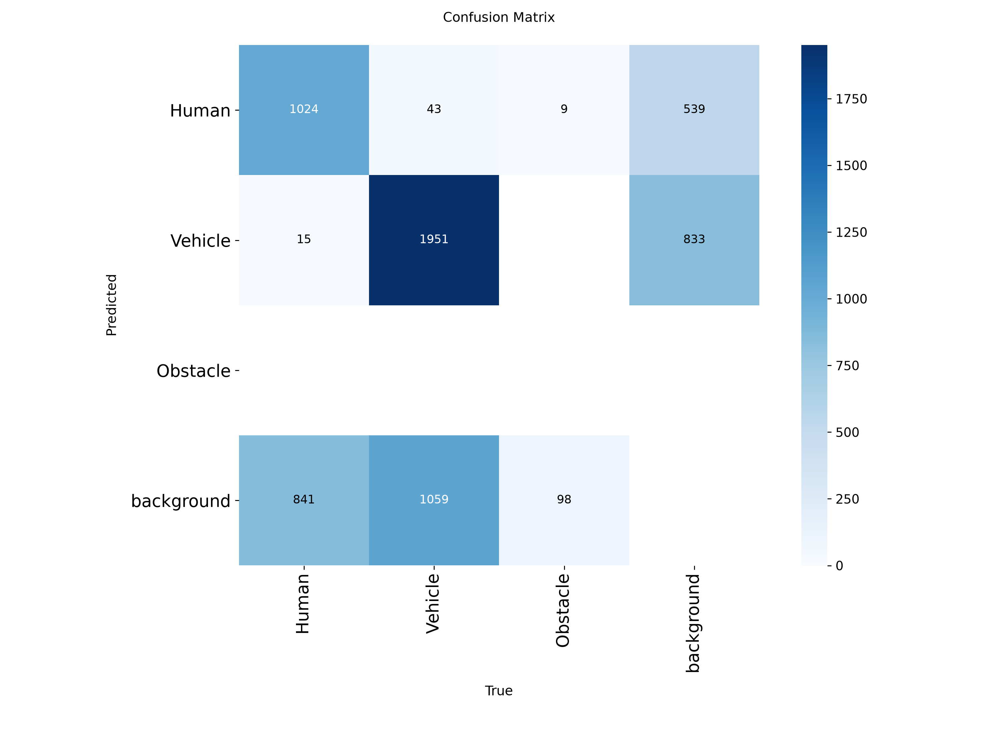

confusion_matrix_normalized.png


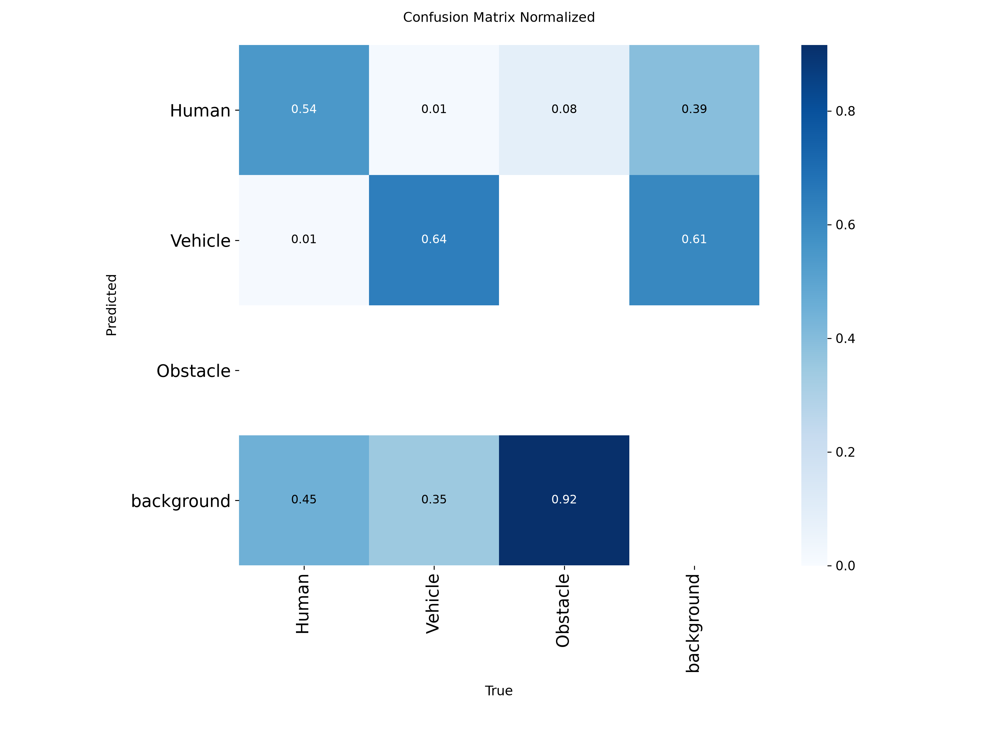

In [26]:
VAL_RUN_DIR = PROJECT_DIR / "runs" / "validation_evaluation"

for name in ["confusion_matrix.png", "confusion_matrix_normalized.png"]:
    path = VAL_RUN_DIR / name
    if path.exists():
        print(name)
        display(Image.open(path))


"Per-class analysis reveals the model performs well on Human (61% recall) and Vehicle (71% recall) detection, but exhibits class collapse on 'Obstacle' — the model essentially never predicts this class, likely due to limited/imbalanced training examples combined with high intra-class visual variability (an 'obstacle' can be almost any shape, unlike the more visually consistent Human/Vehicle classes). Test-set metrics closely track validation metrics (mAP50: 0.494 test vs. ~0.49 val), confirming the train/val/test split is leak-free and results generalize.

Addressing this would require either substantially more labeled obstacle instances, or splitting 'obstacle' into more visually-coherent sub-categories.

## 14. Validation-Set Inference — Visual Qualitative Evaluation

Numbers alone are not enough for an object detector.

We should inspect actual predictions to answer:

- Are vehicles localized correctly?
- Are humans detected when partially obscured?
- Are obstacles detected?
- Are there obvious false positives?
- Does performance degrade on distant/small objects?
- Does fog cause missed detections?


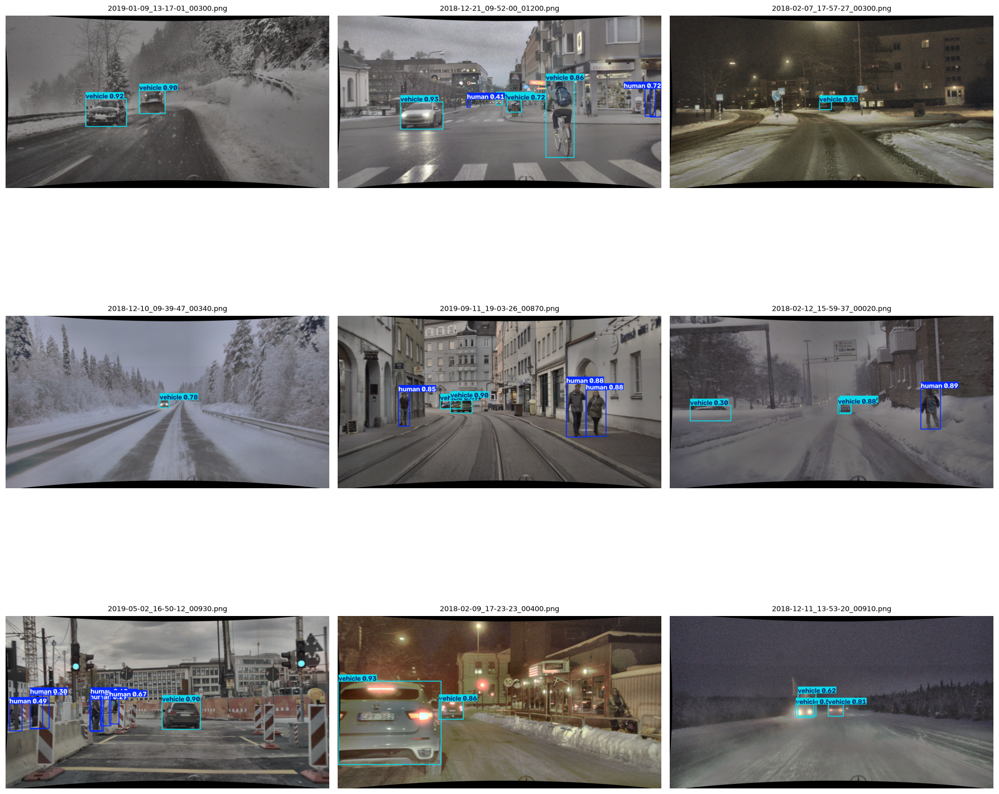

In [27]:
# Predict on random validation images

val_images = [
    p for p in (DATASET_DIR / "images" / "val").rglob("*")
    if p.suffix.lower() in IMAGE_EXTS
]

if val_images:
    sample_paths = random.sample(val_images, min(9, len(val_images)))

    predictions = best_model.predict(
        source=[str(p) for p in sample_paths],
        imgsz=IMAGE_SIZE,
        conf=0.25,
        save=False,
        verbose=False
    )

    cols = 3
    rows = int(np.ceil(len(predictions) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, result, path in zip(axes, predictions, sample_paths):
        annotated = result.plot()
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated)
        ax.set_title(path.name, fontsize=9)
        ax.axis("off")

    for ax in axes[len(predictions):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
else:
    print("No validation images found.")


## 15. Confidence-Threshold Analysis

The confidence threshold changes the precision/recall trade-off.

For a safety-oriented system, this is worth documenting rather than simply accepting the default threshold.

We evaluate several thresholds qualitatively using the validation/test predictions.


In [28]:
# Confidence-threshold sweep on the validation set

thresholds = [0.10, 0.20, 0.25, 0.40, 0.50, 0.60]
threshold_rows = []

for conf in thresholds:
    m = best_model.val(
        data=str(DATA_YAML),
        split="val",
        imgsz=IMAGE_SIZE,
        conf=conf,
        device="cpu",
        plots=False,
        verbose=False
    )

    d = m.results_dict
    threshold_rows.append({
        "confidence": conf,
        "precision": d.get("metrics/precision(B)", np.nan),
        "recall": d.get("metrics/recall(B)", np.nan),
        "mAP50": d.get("metrics/mAP50(B)", np.nan),
        "mAP50-95": d.get("metrics/mAP50-95(B)", np.nan),
    })

threshold_df = pd.DataFrame(threshold_rows)
display(threshold_df)


Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
val: Fast image access  (ping: 0.60.1 ms, read: 899.7190.9 MB/s, size: 2878.0 KB)
val: Scanning C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\val.cache... 2544 images, 21 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2544/2544 627.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 159/159 2.4s/it 6:252.3ss
                   all       2544      20199      0.579      0.449      0.462        0.3
Speed: 1.0ms preprocess, 72.4ms inference, 0.0ms loss, 1.4ms postprocess per image
Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)
val: Fast image access  (ping: 0.20.1 ms, read: 958.5279.7 MB/s, size: 3081.3 KB)
val: Scanning C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\ThroughTheFog_full\labels\val.cache... 2544 images, 21 backgrounds, 0 corru

KeyboardInterrupt: 

## 16. Inference Speed

For a CCTV application, accuracy is only one part of the problem. We also care about inference speed.

Ultralytics reports preprocessing, inference and postprocessing timing during validation. These numbers are hardware-dependent, so report the **GPU/CPU used** alongside the timing.


In [29]:
# Run one validation prediction to obtain timing information

if val_images:
    timing_result = best_model.predict(
        source=str(val_images[0]),
        imgsz=IMAGE_SIZE,
        conf=0.25,
        device="cpu",
        verbose=False
    )[0]

    print("Speed information (milliseconds per image):")
    print(timing_result.speed)


Speed information (milliseconds per image):
{'preprocess': 3.0441000126302242, 'inference': 120.00900000566617, 'postprocess': 0.9418000117875636}


## 17. Export the Trained Model

The PyTorch checkpoint (`best.pt`) is the main training artifact.

For deployment experiments, YOLOv8 can also be exported to formats such as ONNX.

**Keep the original `best.pt` even if you export to another format.**


In [30]:
# Export to ONNX

exported_path = best_model.export(
    format="onnx",
    imgsz=IMAGE_SIZE
)

print("Exported model:", exported_path)


Ultralytics 8.4.132  Python-3.14.0 torch-2.13.0+cpu CPU (AMD Ryzen 7 7735HS with Radeon Graphics)

PyTorch: starting from 'c:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\runs\yolov8n_fog_mine_full\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (5.9 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
   ---------------------------------------- 0.0/17.2 MB ? eta -:--:--
   -- ------------------------------------- 1.0/17.2 MB 5.8 MB/s eta 0:00:03
   ---- ----------------------------------- 1.8/17.2 MB 4.5 MB/s eta 0:00:04
   ------ --------------------------------- 2.6/17.2 MB 4.2 MB/s eta 0:00:04
   ------- -------------------------------- 3.4/17.2 MB 4.2 MB/s eta 0:00:04
   --------- ------------------------------ 4.2/17.2 MB 4.1 MB/s eta 0:00:04
   ----------- ---------------------------- 5.0/17.2 MB 4.1 MB/s eta 0:00:03
   ------------- ---------------

## 18. Final Results Summary

Run the following cell after evaluation to produce a compact table suitable for your report/PPT.

### Report these values

- Model: **YOLOv8n**
- Dataset: **Seeing Through Fog / converted project dataset**
- Classes: **human, vehicle, obstacle**
- Image size
- Epochs
- Precision
- Recall
- mAP@0.50
- mAP@0.50:0.95
- Per-class performance
- Inference time
- GPU used


In [33]:
# Build a compact final-results table

train_n = split_counts["train"]["images"]
val_n = split_counts["val"]["images"]
test_n = split_counts["test"]["images"]

final_rows = {
    "Model": "YOLOv8n",
    "Dataset": "ThroughTheFog_full",
    "Train images": train_n,
    "Validation images": val_n,
    "Test images": test_n,
    "Classes": ", ".join(CLASS_NAMES),
    "Image size": IMAGE_SIZE,
    "Epochs": 20,
    "Device": torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU",
    "Precision": metrics_dict.get("metrics/precision(B)", np.nan),
    "Recall": metrics_dict.get("metrics/recall(B)", np.nan),
    "mAP@0.50": metrics_dict.get("metrics/mAP50(B)", np.nan),
    "mAP@0.50:0.95": metrics_dict.get("metrics/mAP50-95(B)", np.nan),
}

final_table = pd.DataFrame(
    list(final_rows.items()),
    columns=["Metric", "Value"]
)

display(final_table)


,Metric,Value
0,Model,YOLOv8n
1,Dataset,ThroughTheFog_full
2,Train images,8906
3,Validation images,2544
4,Test images,1273
5,Classes,"human, vehicle, obstacle"
6,Image size,640
7,Epochs,20
8,Device,CPU
9,Precision,0.578793


## 19. Interpretation for the Project

The YOLO detector is one component of the complete fog-resilient mine-safety system.

The detector provides:

```text
object class
bounding box
confidence
```

These detections can be passed to the team's **distance/velocity/TTC module**.

The `actual images` pipeline added below is intended for **real-world qualitative testing and pseudo-label generation**. It does not replace human annotation or the held-out benchmark.

### Important limitation

Automatically generated labels are **pseudo-labels**, not ground truth. Review them before using them to retrain the detector.

Real-world footage is especially useful for checking:

- distant vehicles
- partially occluded people
- unusual obstacles
- low-light scenes
- dense fog
- camera viewpoints that differ from ThroughTheFog


## 20. Automatic Labeling of Real-World / YouTube Images

Place frames extracted from real mine footage or YouTube videos in:

```text
actual images/
├── frame_0001.jpg
├── frame_0002.jpg
├── frame_0003.jpg
└── ...
```

The trained `best.pt` model will:

1. Load each image.
2. Detect Human / Vehicle / Obstacle.
3. Save an annotated image with bounding boxes.
4. Save a YOLO-format `.txt` label file.
5. Save detections only above the chosen confidence threshold.

These are **pseudo-labels**. They should be visually reviewed before being used as training data.


In [52]:
# ============================================================
# AUTOMATICALLY LABEL REAL-WORLD IMAGES
# ============================================================

from PIL import Image

ACTUAL_CONFIDENCE = 0.25

if not ACTUAL_IMAGES_DIR.exists():
    raise FileNotFoundError(
        f"Folder not found: {ACTUAL_IMAGES_DIR}\n"
        "Create an 'actual images' folder next to this notebook "
        "and put your extracted frames inside it."
    )

actual_image_paths = [
    p for p in ACTUAL_IMAGES_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in IMAGE_EXTS
]

print(f"Actual images found: {len(actual_image_paths)}")

if len(actual_image_paths) == 0:
    raise ValueError("No supported images found in 'actual images'.")

ACTUAL_OUTPUT_IMAGES.mkdir(parents=True, exist_ok=True)
ACTUAL_OUTPUT_LABELS.mkdir(parents=True, exist_ok=True)

# Load the trained detector
actual_model = YOLO(str(BEST_MODEL))

total_detections = 0
images_with_detections = 0

for image_path in actual_image_paths:

    results = actual_model.predict(
        source=str(image_path),
        imgsz=IMAGE_SIZE,
        conf=ACTUAL_CONFIDENCE,
        device=DEVICE,
        verbose=False
    )

    result = results[0]

    # --------------------------------------------------------
    # Save annotated image
    # --------------------------------------------------------
    annotated_bgr = result.plot()

    annotated_rgb = cv2.cvtColor(
        annotated_bgr,
        cv2.COLOR_BGR2RGB
    )

    annotated_pil = Image.fromarray(annotated_rgb)

    annotated_pil.save(
        ACTUAL_OUTPUT_IMAGES / image_path.name
    )

    # --------------------------------------------------------
    # Save clean YOLO label
    # Format:
    # class_id x_center y_center width height
    # --------------------------------------------------------
    label_path = (
        ACTUAL_OUTPUT_LABELS /
        f"{image_path.stem}.txt"
    )

    detections_for_image = 0

    with open(label_path, "w", encoding="utf-8") as f:

        if result.boxes is not None:

            for box in result.boxes:

                cls_id = int(box.cls.item())
                confidence = float(box.conf.item())

                # xywhn = normalized YOLO coordinates
                x, y, w, h = (
                    box.xywhn[0].tolist()
                )

                f.write(
                    f"{cls_id} "
                    f"{x:.6f} "
                    f"{y:.6f} "
                    f"{w:.6f} "
                    f"{h:.6f}\n"
                )

                detections_for_image += 1
                total_detections += 1

    if detections_for_image > 0:
        images_with_detections += 1

print("\n" + "=" * 60)
print("REAL-WORLD AUTO-LABELING COMPLETE")
print("=" * 60)

print(f"Images processed       : {len(actual_image_paths)}")
print(f"Images with detections : {images_with_detections}")
print(f"Total detections       : {total_detections}")
print(f"Confidence threshold   : {ACTUAL_CONFIDENCE}")

print("\nAnnotated images:")
print(ACTUAL_OUTPUT_IMAGES.resolve())

print("\nYOLO pseudo-labels:")
print(ACTUAL_OUTPUT_LABELS.resolve())


Actual images found: 24

REAL-WORLD AUTO-LABELING COMPLETE
Images processed       : 24
Images with detections : 15
Total detections       : 21
Confidence threshold   : 0.25

Annotated images:
C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\actual_images_labeled\images

YOLO pseudo-labels:
C:\Users\TANVI\Downloads\STF DOWNLOADER\STF_downloads\actual_images_labeled\labels


In [53]:

# ============================================================
# AUTOMATICALLY LABEL REAL-WORLD IMAGES
# WITH PREPROCESSING
# ============================================================

from pathlib import Path

import cv2
import numpy as np
from PIL import Image
from ultralytics import YOLO


ACTUAL_CONFIDENCE = 0.25

def preprocess_for_detection(image):
    """
    Mild preprocessing before YOLO inference.

    Steps:
    1. Convert BGR -> LAB
    2. Apply CLAHE to luminance channel
    3. Convert LAB -> BGR
    4. Apply mild sharpening

    Image dimensions are preserved.
    """

    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    l, a, b = cv2.split(lab)

    # --------------------------------------------------------
    # CLAHE - local contrast enhancement
    # --------------------------------------------------------
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    l = clahe.apply(l)

    lab = cv2.merge((l, a, b))

    enhanced = cv2.cvtColor(
        lab,
        cv2.COLOR_LAB2BGR
    )

    # --------------------------------------------------------
    # Mild sharpening
    # --------------------------------------------------------
    kernel = np.array([
        [0, -1,  0],
        [-1, 5, -1],
        [0, -1,  0]
    ], dtype=np.float32)

    sharpened = cv2.filter2D(
        enhanced,
        -1,
        kernel
    )

    return sharpened




if not ACTUAL_IMAGES_DIR.exists():
    raise FileNotFoundError(
        f"Folder not found: {ACTUAL_IMAGES_DIR}\n"
        "Create an 'actual images' folder next to this notebook "
        "and put your extracted frames inside it."
    )



actual_image_paths = [
    p
    for p in ACTUAL_IMAGES_DIR.rglob("*")
    if p.is_file()
    and p.suffix.lower() in IMAGE_EXTS
]

print(f"Actual images found: {len(actual_image_paths)}")


if len(actual_image_paths) == 0:
    raise ValueError(
        "No supported images found in 'actual images'."
    )


ACTUAL_OUTPUT_IMAGES_b.mkdir(
    parents=True,
    exist_ok=True
)

ACTUAL_OUTPUT_LABELS_b.mkdir(
    parents=True,
    exist_ok=True
)



actual_model = YOLO(str(BEST_MODEL))

total_detections = 0
images_with_detections = 0
images_failed = 0




for image_path in actual_image_paths:

    print(f"Processing: {image_path.name}")

  
    original_image = cv2.imread(str(image_path))

    if original_image is None:
        print(
            f"WARNING: Could not read image: {image_path}"
        )
        images_failed += 1
        continue


    preprocessed_image = preprocess_for_detection(
        original_image
    )



    results = actual_model.predict(
        source=preprocessed_image,
        imgsz=IMAGE_SIZE,
        conf=ACTUAL_CONFIDENCE,
        device=DEVICE,
        verbose=False
    )

    result = results[0]




    annotated_bgr = original_image.copy()


    detections_for_image = 0


    if result.boxes is not None:

        for box in result.boxes:

          
            x1, y1, x2, y2 = (
                box.xyxy[0]
                .cpu()
                .numpy()
                .astype(int)
            )


            cls_id = int(box.cls.item())
            confidence = float(box.conf.item())


            class_name = actual_model.names[cls_id]


          
            label = (
                f"{class_name} "
                f"{confidence:.2f}"
            )


           
            cv2.rectangle(
                annotated_bgr,
                (x1, y1),
                (x2, y2),
                (0, 255, 0),
                2
            )


            cv2.putText(
                annotated_bgr,
                label,
                (x1, max(y1 - 10, 20)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                (0, 255, 0),
                2
            )



    annotated_rgb = cv2.cvtColor(
        annotated_bgr,
        cv2.COLOR_BGR2RGB
    )


   
    annotated_pil = Image.fromarray(
        annotated_rgb
    )


    annotated_pil.save(
        ACTUAL_OUTPUT_IMAGES_b / image_path.name
    )


 

    label_path = (
        ACTUAL_OUTPUT_LABELS_b/
        f"{image_path.stem}.txt"
    )


    with open(
        label_path,
        "w",
        encoding="utf-8"
    ) as f:

        if result.boxes is not None:

            for box in result.boxes:

                cls_id = int(
                    box.cls.item()
                )


                confidence = float(
                    box.conf.item()
                )


              
                x, y, w, h = (
                    box.xywhn[0].tolist()
                )


                f.write(
                    f"{cls_id} "
                    f"{x:.6f} "
                    f"{y:.6f} "
                    f"{w:.6f} "
                    f"{h:.6f}\n"
                )


                detections_for_image += 1
                total_detections += 1


    if detections_for_image > 0:
        images_with_detections += 1


print("\n" + "=" * 60)
print("REAL-WORLD AUTO-LABELING COMPLETE")
print("=" * 60)

print(
    f"Images processed       : "
    f"{len(actual_image_paths) - images_failed}"
)

print(
    f"Images failed         : "
    f"{images_failed}"
)

print(
    f"Images with detections : "
    f"{images_with_detections}"
)

print(
    f"Total detections       : "
    f"{total_detections}"
)

print(
    f"Confidence threshold   : "
    f"{ACTUAL_CONFIDENCE}"
)

print(
    "\nPreprocessing:"
)

print(
    "  - CLAHE contrast enhancement"
)

print(
    "  - Mild sharpening"
)

print("\nAnnotated images:")
print(
    ACTUAL_OUTPUT_IMAGES.resolve()
)

print("\nYOLO pseudo-labels:")
print(
    ACTUAL_OUTPUT_LABELS.resolve()
)


Actual images found: 24
Processing: 1.png
Processing: 10.png
Processing: 11.png
Processing: 12.png
Processing: 13.png
Processing: 14.png
Processing: 2.png
Processing: 3.png
Processing: 4.png
Processing: 5.png
Processing: 6.png
Processing: 7.png
Processing: 8.png
Processing: 9.png
Processing: Screenshot 2026-09-13 161520.png
Processing: Screenshot 2026-09-13 161536.png
Processing: Screenshot 2026-09-13 161602.png
Processing: Screenshot 2026-09-13 161612.png
Processing: Screenshot 2026-09-13 161847.png
Processing: Screenshot 2026-09-13 162051.png
Processing: Screenshot 2026-09-13 162104.png
Processing: Screenshot 2026-09-13 162111.png
Processing: Screenshot 2026-09-13 162140.png
Processing: Screenshot 2026-09-13 162202.png

REAL-WORLD AUTO-LABELING COMPLETE
Images processed       : 24
Images failed         : 0
Images with detections : 11
Total detections       : 19
Confidence threshold   : 0.25

Preprocessing:
  - CLAHE contrast enhancement
  - Mild sharpening

Annotated images:
C:\Users

### Output structure

After the cell runs:

```text
actual_images_labeled/
├── images/
│   ├── frame_0001.jpg     # image + predicted boxes
│   ├── frame_0002.jpg
│   └── ...
│
└── labels/
    ├── frame_0001.txt     # YOLO pseudo-labels
    ├── frame_0002.txt
    └── ...
```

Example label:

```text
1 0.532100 0.481200 0.214500 0.301700
```

means:

```text
class 1 = Vehicle
x_center = 0.5321
y_center = 0.4812
width    = 0.2145
height   = 0.3017
```

### Important

Do **not** automatically add these pseudo-labeled images to the training set.

First inspect the annotated images and correct incorrect/missing boxes. Only reviewed labels should become additional training data.
